# Forex Trading Bot - Exploratory Data Analysis (EDA)

**Capstone Project - Spring 2026**

This notebook explores:
1. Forex price data (5 major pairs, 10 years)
2. Economic indicators (FRED data)
3. Data quality assessment
4. Initial insights and hypotheses

## 1. Setup & Data Loading

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.4f}'.format)

print('✅ Libraries loaded')

✅ Libraries loaded


In [2]:
# Load forex price data
forex_df = pd.read_csv('../data/raw/forex_dataset_daily.csv')
forex_df['Date'] = pd.to_datetime(forex_df['Date'])

print(f'Forex Data Shape: {forex_df.shape}')
print(f'Date Range: {forex_df["Date"].min()} to {forex_df["Date"].max()}')
print(f'Pairs: {forex_df["Pair"].unique()}')
forex_df.head()

Forex Data Shape: (13115, 7)
Date Range: 2016-01-01 00:00:00 to 2026-01-30 00:00:00
Pairs: ['EURUSD' 'USDJPY' 'GBPUSD' 'AUDUSD' 'USDCAD']


,Date,Close,High,Low,Open,Volume,Pair
0,2016-01-01,1.0859,1.0867,1.0859,1.0859,0,EURUSD
1,2016-01-04,1.0854,1.0946,1.0806,1.0855,0,EURUSD
2,2016-01-05,1.0828,1.0841,1.0712,1.0826,0,EURUSD
3,2016-01-06,1.0752,1.0772,1.0722,1.0752,0,EURUSD
4,2016-01-07,1.0779,1.0876,1.0774,1.0778,0,EURUSD


In [3]:
# Load economic data
econ_df = pd.read_csv('../data/economic/fred_data.csv', index_col=0, parse_dates=True)

print(f'Economic Data Shape: {econ_df.shape}')
print(f'Date Range: {econ_df.index.min()} to {econ_df.index.max()}')
print(f'Indicators: {list(econ_df.columns)}')
econ_df.head()

Economic Data Shape: (3690, 9)
Date Range: 2016-01-01 00:00:00 to 2026-02-06 00:00:00
Indicators: ['FEDFUNDS', 'CPIAUCSL', 'UNRATE', 'GDP', 'T10Y2Y', 'DTWEXBGS', 'IR3TIB01JPM156N', 'ECBMRRFR', 'BOGZ1FL073164003Q']


,FEDFUNDS,CPIAUCSL,UNRATE,GDP,T10Y2Y,DTWEXBGS,IR3TIB01JPM156N,ECBMRRFR,BOGZ1FL073164003Q
2016-01-01,0.3400,237.6520,4.8000,18525.9330,NaN,NaN,0.1690,0.0500,1020738.0000
2016-01-02,0.3400,237.6520,4.8000,18525.9330,NaN,NaN,0.1690,0.0500,1020738.0000
2016-01-03,0.3400,237.6520,4.8000,18525.9330,NaN,NaN,0.1690,0.0500,1020738.0000
2016-01-04,0.3400,237.6520,4.8000,18525.9330,1.2200,114.1595,0.1690,0.0500,1020738.0000
2016-01-05,0.3400,237.6520,4.8000,18525.9330,1.2100,114.2649,0.1690,0.0500,1020738.0000


## 2. Data Quality Assessment

In [4]:
# Check for missing values - Forex
print('=== FOREX DATA QUALITY ===')
print('\nMissing Values:')
print(forex_df.isnull().sum())
print(f'\nTotal Missing: {forex_df.isnull().sum().sum()}')

=== FOREX DATA QUALITY ===

Missing Values:
Date      0
Close     0
High      0
Low       0
Open      0
Volume    0
Pair      0
dtype: int64

Total Missing: 0


In [5]:
# Check for missing values - Economic
print('=== ECONOMIC DATA QUALITY ===')
print('\nMissing Values (after forward fill):')
print(econ_df.isnull().sum())
print(f'\nTotal Missing: {econ_df.isnull().sum().sum()}')

=== ECONOMIC DATA QUALITY ===

Missing Values (after forward fill):
FEDFUNDS             0
CPIAUCSL             0
UNRATE               0
GDP                  0
T10Y2Y               3
DTWEXBGS             3
IR3TIB01JPM156N      0
ECBMRRFR             0
BOGZ1FL073164003Q    0
dtype: int64

Total Missing: 6


=== DATA POINTS PER PAIR ===
Pair
AUDUSD    2623
EURUSD    2623
GBPUSD    2623
USDCAD    2623
USDJPY    2623
dtype: int64


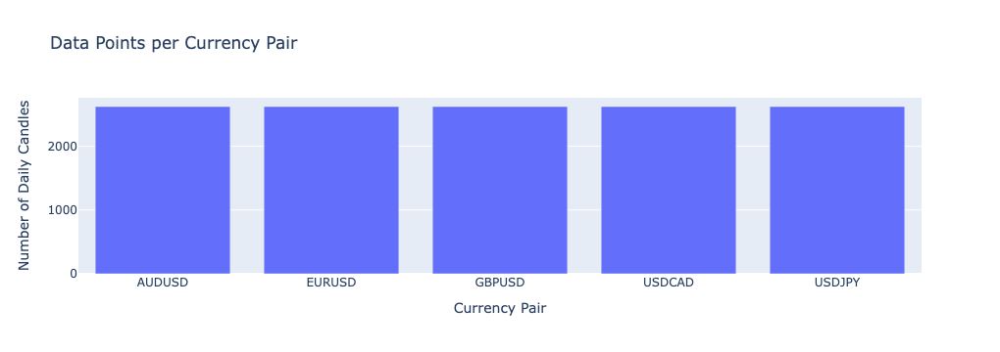

In [6]:
# Data points per currency pair
print('=== DATA POINTS PER PAIR ===')
pair_counts = forex_df.groupby('Pair').size()
print(pair_counts)

# Visualize
fig = px.bar(x=pair_counts.index, y=pair_counts.values, 
             title='Data Points per Currency Pair',
             labels={'x': 'Currency Pair', 'y': 'Number of Daily Candles'})
fig.show()

## 3. Forex Price Analysis

In [7]:
# Summary statistics per pair
print('=== SUMMARY STATISTICS ===')
summary = forex_df.groupby('Pair')['Close'].describe()
summary

=== SUMMARY STATISTICS ===


,count,mean,std,min,25%,50%,75%,max
Pair,,,,,,,,
AUDUSD,2623.0000,0.7059,0.0474,0.5743,0.6655,0.7058,0.7473,0.8117
EURUSD,2623.0000,1.1215,0.0538,0.9596,1.0843,1.1189,1.1648,1.2510
GBPUSD,2623.0000,1.2999,0.0646,1.0728,1.2554,1.2965,1.3411,1.4789
USDCAD,2623.0000,1.3262,0.0497,1.2038,1.2885,1.3271,1.3604,1.4717
USDJPY,2623.0000,123.2450,18.2521,99.9060,109.0400,112.9780,143.1875,161.6210


In [ ]:
# Price trends over time - All pairs
fig = px.line(forex_df, x='Date', y='Close', color='Pair',
              title='Forex Prices Over 10 Years (2016-2026)',
              labels={'Close': 'Price', 'Date': 'Date'})
fig.update_layout(height=500)
fig.show()

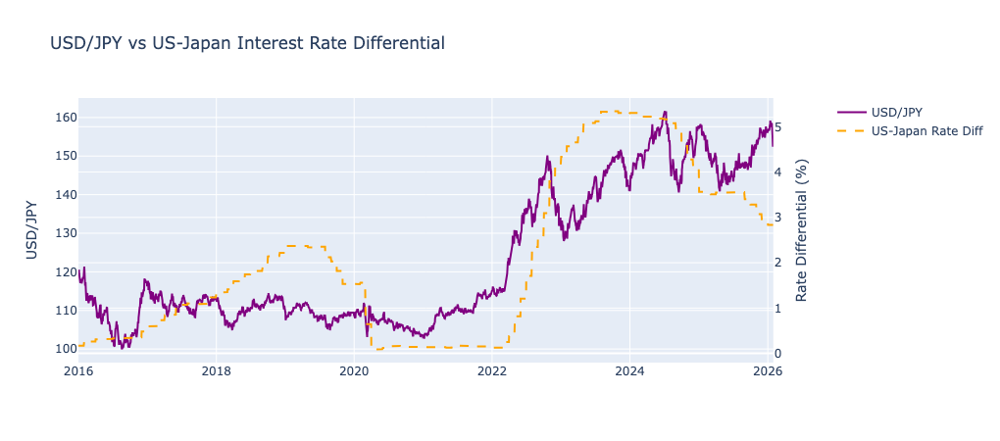

Correlation (USD/JPY vs Rate Differential): 0.833


In [9]:
# USD/JPY vs Interest Rate Differential (Fed - Japan)
usdjpy_econ = forex_df[forex_df['Pair'] == 'USDJPY'].set_index('Date')[['Close']].copy()
usdjpy_econ = usdjpy_econ.join(econ_df[['FEDFUNDS', 'IR3TIB01JPM156N']], how='inner')
usdjpy_econ['Rate_Differential'] = usdjpy_econ['FEDFUNDS'] - usdjpy_econ['IR3TIB01JPM156N']

fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(x=usdjpy_econ.index, y=usdjpy_econ['Close'], name='USD/JPY', line=dict(color='purple')),
    secondary_y=False
)

fig.add_trace(
    go.Scatter(x=usdjpy_econ.index, y=usdjpy_econ['Rate_Differential'], 
               name='US-Japan Rate Diff', line=dict(dash='dash', color='orange')),
    secondary_y=True
)

fig.update_layout(title='USD/JPY vs US-Japan Interest Rate Differential', height=450)
fig.update_yaxes(title_text='USD/JPY', secondary_y=False)
fig.update_yaxes(title_text='Rate Differential (%)', secondary_y=True)
fig.show()

corr = usdjpy_econ['Close'].corr(usdjpy_econ['Rate_Differential'])
print(f"Correlation (USD/JPY vs Rate Differential): {corr:.3f}")

### USD/JPY Analysis

USD/JPY is shown separately because it has a different scale (~100-160) compared to other pairs (~0.7-1.5). 

**Key drivers for USD/JPY:**
- US Federal Reserve interest rates (FEDFUNDS)
- Bank of Japan interest rates (IR3TIB01JPM156N)
- Risk sentiment (JPY is a "safe haven" currency)

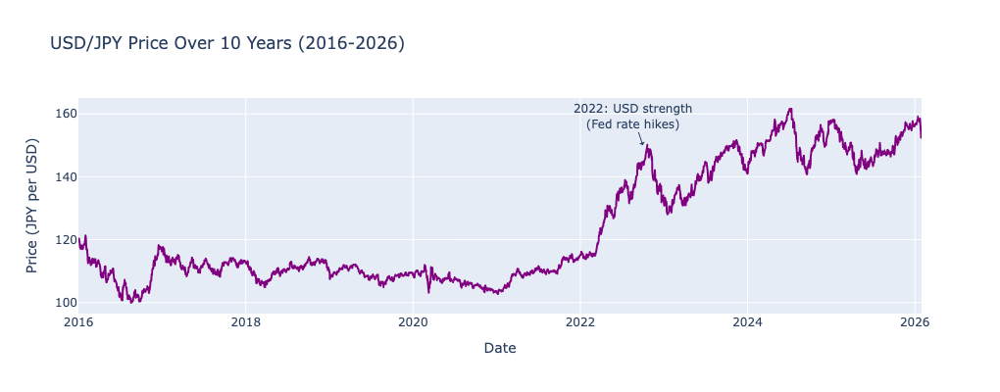

USD/JPY Range: 99.91 - 161.62


In [10]:
# USD/JPY on separate chart (different scale: ~100-160 vs ~0.7-1.4)
usdjpy_df = forex_df[forex_df['Pair'] == 'USDJPY']

fig = px.line(usdjpy_df, x='Date', y='Close',
              title='USD/JPY Price Over 10 Years (2016-2026)',
              labels={'Close': 'Price (JPY per USD)', 'Date': 'Date'})
fig.update_traces(line_color='purple')
fig.update_layout(height=400)

# Add annotation for key events
fig.add_annotation(x='2022-10-01', y=150, text='2022: USD strength<br>(Fed rate hikes)',
                   showarrow=True, arrowhead=1)
fig.show()

print(f"USD/JPY Range: {usdjpy_df['Close'].min():.2f} - {usdjpy_df['Close'].max():.2f}")

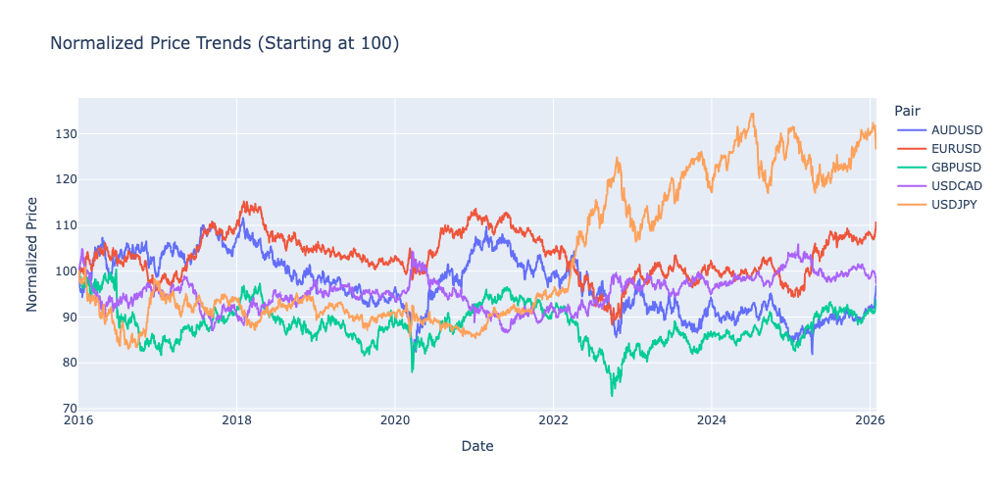

In [11]:
# Normalized prices (to compare trends)
forex_pivot = forex_df.pivot(index='Date', columns='Pair', values='Close')
forex_normalized = forex_pivot / forex_pivot.iloc[0] * 100  # Start at 100

fig = px.line(forex_normalized, 
              title='Normalized Price Trends (Starting at 100)',
              labels={'value': 'Normalized Price', 'Date': 'Date'})
fig.update_layout(height=500)
fig.show()

In [12]:
# Calculate daily returns
forex_pivot = forex_df.pivot(index='Date', columns='Pair', values='Close')
returns = forex_pivot.pct_change().dropna()

print('=== DAILY RETURNS STATISTICS ===')
returns_stats = returns.describe()
returns_stats.loc['annualized_vol'] = returns.std() * np.sqrt(252)  # Annualized volatility
returns_stats

=== DAILY RETURNS STATISTICS ===


Pair,AUDUSD,EURUSD,GBPUSD,USDCAD,USDJPY
count,2622.0000,2622.0000,2622.0000,2622.0000,2622.0000
mean,0.0000,0.0000,-0.0000,-0.0000,0.0001
std,0.0063,0.0046,0.0058,0.0044,0.0057
min,-0.0531,-0.0278,-0.0760,-0.0314,-0.0372
25%,-0.0037,-0.0027,-0.0030,-0.0024,-0.0030
50%,0.0001,-0.0001,0.0000,0.0001,0.0003
75%,0.0036,0.0027,0.0031,0.0024,0.0032
max,0.0299,0.0279,0.0308,0.0301,0.0270
annualized_vol,0.0993,0.0732,0.0923,0.0700,0.0907


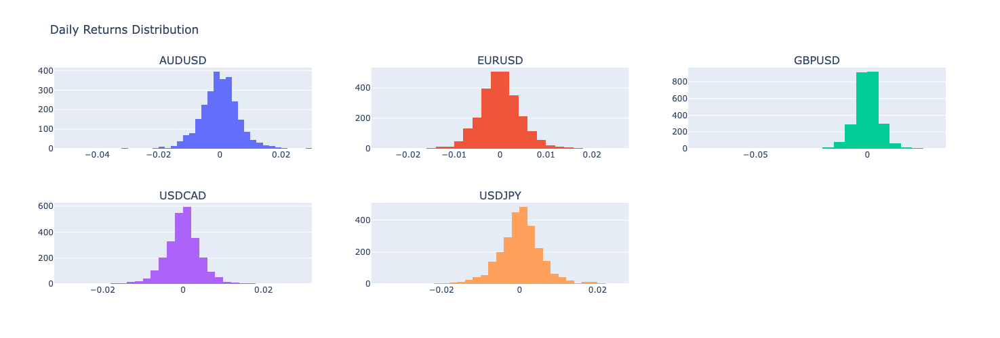

In [13]:
# Returns distribution
fig = make_subplots(rows=2, cols=3, subplot_titles=returns.columns.tolist())

for i, pair in enumerate(returns.columns):
    row = i // 3 + 1
    col = i % 3 + 1
    fig.add_trace(
        go.Histogram(x=returns[pair], name=pair, nbinsx=50),
        row=row, col=col
    )

fig.update_layout(height=500, title_text='Daily Returns Distribution', showlegend=False)
fig.show()

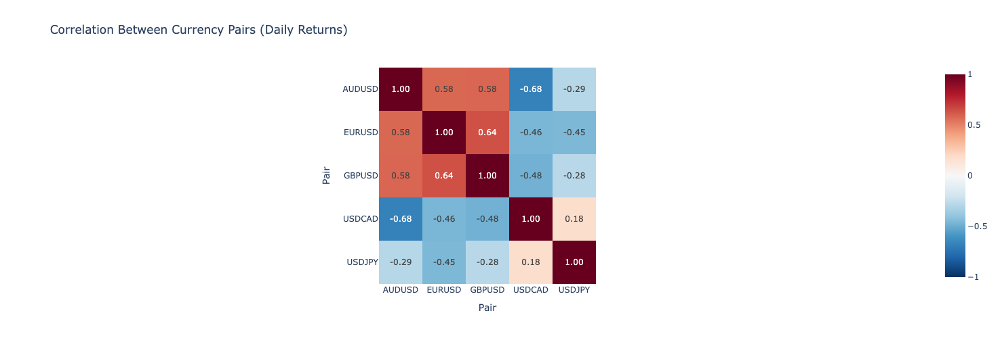

In [14]:
# Correlation heatmap between pairs
correlation = returns.corr()

fig = px.imshow(correlation, 
                text_auto='.2f',
                title='Correlation Between Currency Pairs (Daily Returns)',
                color_continuous_scale='RdBu_r',
                zmin=-1, zmax=1)
fig.update_layout(height=500)
fig.show()

### Key Insight: Correlation Analysis

Pairs that are highly correlated move together. Trading multiple correlated pairs increases risk!

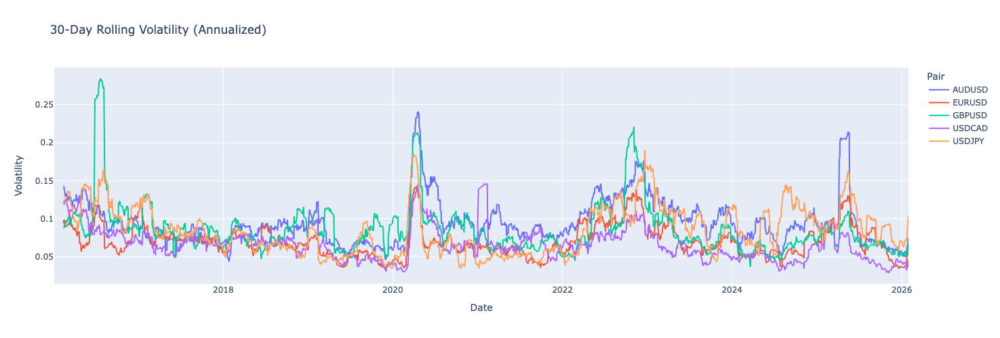

In [15]:
# Volatility over time (30-day rolling)
rolling_vol = returns.rolling(window=30).std() * np.sqrt(252)  # Annualized

fig = px.line(rolling_vol, 
              title='30-Day Rolling Volatility (Annualized)',
              labels={'value': 'Volatility', 'Date': 'Date'})
fig.update_layout(height=500)
fig.show()

## 4. Economic Indicators Analysis

In [16]:
# Economic indicators summary
print('=== ECONOMIC INDICATORS SUMMARY ===')
econ_df.describe()

=== ECONOMIC INDICATORS SUMMARY ===


,FEDFUNDS,CPIAUCSL,UNRATE,GDP,T10Y2Y,DTWEXBGS,IR3TIB01JPM156N,ECBMRRFR,BOGZ1FL073164003Q
count,3690.0000,3690.0000,3690.0000,3690.0000,3687.0000,3687.0000,3690.0000,3690.0000,3690.0000
mean,2.2061,276.0100,4.5809,24030.1360,0.3850,117.1329,0.1157,1.1046,1479375.8290
std,1.9031,29.1896,1.7082,4097.4978,0.5779,4.8725,0.2496,1.6429,322708.0412
min,0.0500,237.3360,3.4000,18525.9330,-1.0800,106.4877,-0.0720,0.0000,1020738.0000
25%,0.3800,251.2140,3.7000,20580.9120,0.1000,113.4429,-0.0160,0.0000,1245206.0000
50%,1.6900,262.6390,4.1000,22680.6930,0.4400,116.4223,0.0500,0.0000,1448764.0000
75%,4.3300,304.6150,4.7000,28074.8460,0.8200,120.8427,0.0780,2.1500,1685289.0000
max,5.3300,326.0300,14.8000,31098.0270,1.5900,130.0413,0.8209,4.5000,2156454.0000


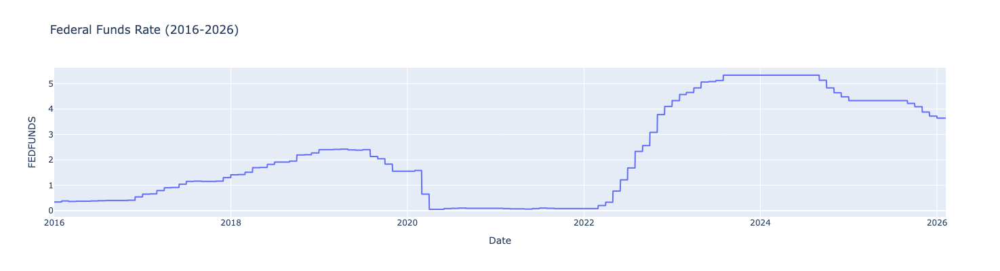

In [17]:
# Fed Funds Rate over time
fig = px.line(econ_df, y='FEDFUNDS', 
              title='Federal Funds Rate (2016-2026)',
              labels={'value': 'Rate (%)', 'index': 'Date'})
fig.update_layout(height=400)
fig.show()

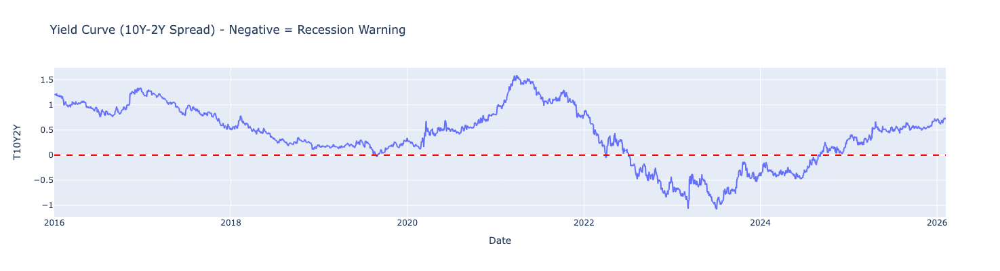

In [18]:
# Yield Curve (recession indicator)
fig = px.line(econ_df, y='T10Y2Y', 
              title='Yield Curve (10Y-2Y Spread) - Negative = Recession Warning',
              labels={'value': 'Spread (%)', 'index': 'Date'})
fig.add_hline(y=0, line_dash='dash', line_color='red')
fig.update_layout(height=400)
fig.show()

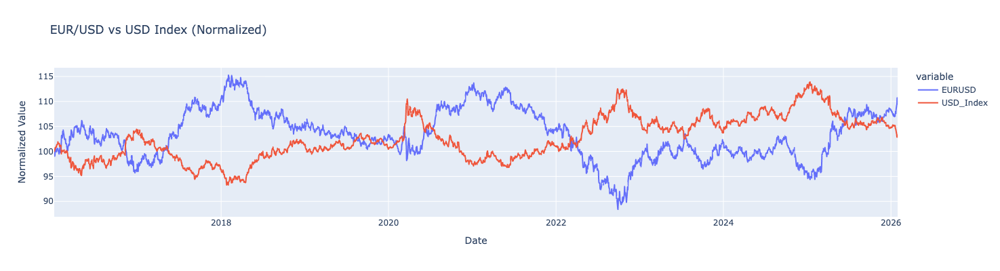

Correlation: -0.732


In [19]:
# USD Index vs EUR/USD (should be inversely correlated)
eurusd = forex_df[forex_df['Pair'] == 'EURUSD'].set_index('Date')['Close']
usd_index = econ_df['DTWEXBGS']

# Align dates
combined = pd.DataFrame({
    'EURUSD': eurusd,
    'USD_Index': usd_index
}).dropna()

# Normalize
combined_norm = combined / combined.iloc[0] * 100

fig = px.line(combined_norm, 
              title='EUR/USD vs USD Index (Normalized)',
              labels={'value': 'Normalized Value', 'index': 'Date'})
fig.update_layout(height=400)
fig.show()

print(f'Correlation: {combined["EURUSD"].corr(combined["USD_Index"]):.3f}')

## 5. Forex + Economic Data Combined

In [20]:
# Merge forex and economic data
eurusd_df = forex_df[forex_df['Pair'] == 'EURUSD'].copy()
eurusd_df = eurusd_df.set_index('Date')

# Join with economic data
merged = eurusd_df.join(econ_df, how='inner')

print(f'Merged Data Shape: {merged.shape}')
merged.head()

Merged Data Shape: (2623, 15)


,Close,High,Low,Open,Volume,Pair,FEDFUNDS,CPIAUCSL,UNRATE,GDP,T10Y2Y,DTWEXBGS,IR3TIB01JPM156N,ECBMRRFR,BOGZ1FL073164003Q
2016-01-01,1.0859,1.0867,1.0859,1.0859,0,EURUSD,0.3400,237.6520,4.8000,18525.9330,NaN,NaN,0.1690,0.0500,1020738.0000
2016-01-04,1.0854,1.0946,1.0806,1.0855,0,EURUSD,0.3400,237.6520,4.8000,18525.9330,1.2200,114.1595,0.1690,0.0500,1020738.0000
2016-01-05,1.0828,1.0841,1.0712,1.0826,0,EURUSD,0.3400,237.6520,4.8000,18525.9330,1.2100,114.2649,0.1690,0.0500,1020738.0000
2016-01-06,1.0752,1.0772,1.0722,1.0752,0,EURUSD,0.3400,237.6520,4.8000,18525.9330,1.1900,114.6177,0.1690,0.0500,1020738.0000
2016-01-07,1.0779,1.0876,1.0774,1.0778,0,EURUSD,0.3400,237.6520,4.8000,18525.9330,1.2000,114.6516,0.1690,0.0500,1020738.0000


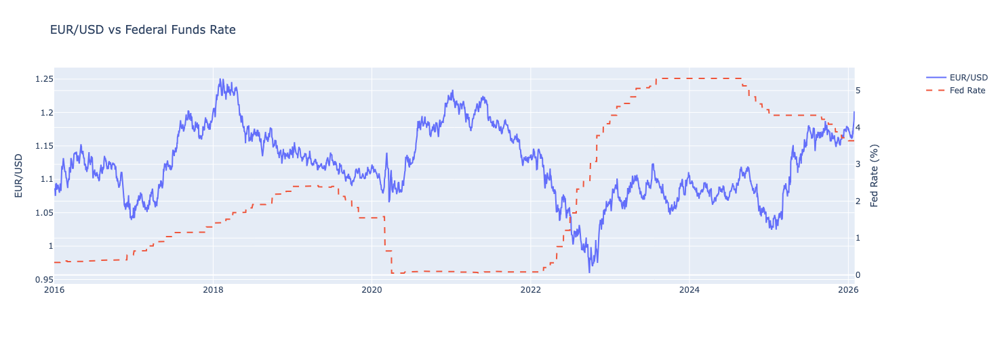

In [21]:
# EUR/USD vs Fed Funds Rate
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(x=merged.index, y=merged['Close'], name='EUR/USD'),
    secondary_y=False
)

fig.add_trace(
    go.Scatter(x=merged.index, y=merged['FEDFUNDS'], name='Fed Rate', line=dict(dash='dash')),
    secondary_y=True
)

fig.update_layout(title='EUR/USD vs Federal Funds Rate', height=500)
fig.update_yaxes(title_text='EUR/USD', secondary_y=False)
fig.update_yaxes(title_text='Fed Rate (%)', secondary_y=True)
fig.show()

In [22]:
# Correlation: Price vs Economic Indicators
merged['Returns'] = merged['Close'].pct_change()

# Calculate correlations
econ_columns = ['FEDFUNDS', 'CPIAUCSL', 'UNRATE', 'T10Y2Y', 'DTWEXBGS']
correlations = {}

for col in econ_columns:
    correlations[col] = merged['Returns'].corr(merged[col].pct_change())

corr_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation with EUR/USD Returns'])
corr_df

,Correlation with EUR/USD Returns
FEDFUNDS,0.0033
CPIAUCSL,-0.0372
UNRATE,0.0018
T10Y2Y,NaN
DTWEXBGS,-0.2033


## 6. Key Findings & Insights

In [23]:
# Calculate key statistics for report
print('=' * 60)
print('KEY FINDINGS FOR EDA REPORT')
print('=' * 60)

print('\n📊 DATA OVERVIEW:')
print(f'   - Forex data: {len(forex_df):,} rows across {forex_df["Pair"].nunique()} pairs')
print(f'   - Economic data: {len(econ_df):,} rows, {len(econ_df.columns)} indicators')
print(f'   - Date range: {forex_df["Date"].min().strftime("%Y-%m-%d")} to {forex_df["Date"].max().strftime("%Y-%m-%d")}')
print(f'   - Missing values: {forex_df.isnull().sum().sum()} (forex), {econ_df.isnull().sum().sum()} (econ)')

print('\n📈 VOLATILITY INSIGHTS:')
for pair in returns.columns:
    vol = returns[pair].std() * np.sqrt(252) * 100
    print(f'   - {pair}: {vol:.1f}% annualized volatility')

print('\n🔗 CORRELATION INSIGHTS:')
print(f'   - Highest correlation: EURUSD-GBPUSD ({correlation.loc["EURUSD", "GBPUSD"]:.2f})')
print(f'   - Lowest correlation: USDJPY-AUDUSD ({correlation.loc["USDJPY", "AUDUSD"]:.2f})')

print('\n💡 INITIAL HYPOTHESES:')
print('   1. Higher Fed rates correlate with USD strength (lower EUR/USD)')
print('   2. Yield curve inversion precedes increased volatility')
print('   3. Correlated pairs should not be traded simultaneously')
print('   4. Volatility clustering exists - high vol follows high vol')

KEY FINDINGS FOR EDA REPORT

📊 DATA OVERVIEW:
   - Forex data: 13,115 rows across 5 pairs
   - Economic data: 3,690 rows, 9 indicators
   - Date range: 2016-01-01 to 2026-01-30
   - Missing values: 0 (forex), 6 (econ)

📈 VOLATILITY INSIGHTS:
   - AUDUSD: 9.9% annualized volatility
   - EURUSD: 7.3% annualized volatility
   - GBPUSD: 9.2% annualized volatility
   - USDCAD: 7.0% annualized volatility
   - USDJPY: 9.1% annualized volatility

🔗 CORRELATION INSIGHTS:
   - Highest correlation: EURUSD-GBPUSD (0.64)
   - Lowest correlation: USDJPY-AUDUSD (-0.29)

💡 INITIAL HYPOTHESES:
   1. Higher Fed rates correlate with USD strength (lower EUR/USD)
   2. Yield curve inversion precedes increased volatility
   3. Correlated pairs should not be traded simultaneously
   4. Volatility clustering exists - high vol follows high vol


## 7. Data Cleaning Plan

Based on EDA, the following cleaning steps are needed:

1. **Handle missing values**: Forward-fill for economic data (already done)
2. **Align timestamps**: Merge forex daily data with economic data on matching dates
3. **Feature engineering** (next notebook):
   - Calculate returns
   - Add technical indicators (RSI, MACD, Bollinger Bands)
   - Create economic event features
4. **Normalization**: Scale features for RL model input

In [24]:
print('✅ EDA Complete!')
print('\nNext steps:')
print('1. Feature engineering (technical indicators)')
print('2. Build Gym trading environment')
print('3. Train baseline strategies')

✅ EDA Complete!

Next steps:
1. Feature engineering (technical indicators)
2. Build Gym trading environment
3. Train baseline strategies
